# **SYNTHETIC APERTURE RADAR (SAR) BASED FLOOD EXTENT MAPPING IN COMPLEX LAND COVER AREAS**

By: David Mwenda Muriithi

# **About Me**
**Occupation**: PhD Student

**Course**: PhD in Earth Observation (XL-Cycle)

**Affiliation**:

Sapienza Università di Roma


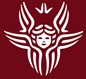


**Research Station**:

Università di Trento

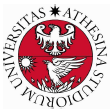

**Research interests**:
* EO for flood extent mapping

* GeoAI for Disaster Risk Reduction


SAR presents a great solution for local to global near real-time flood extent mapping thanks to its ‘all weather’, day or night and canopy penetrating capabilities This study focussing on the Tana Delta, Kenya  tests 3 Sentinel-1 C-Band SAR flood detection approaches i.e. Otsu thresholding, Change detection and a Hybrid (Otsu + change detection) approach. Sentinel-2 supervised classification is also added for comparison.

Implemented on Google Earth Engine, preliminary results show higher flood area estimates for SAR and optical single image approaches. Further, the SAR change detection’s accuracy is dependent on the change threshold. The VH channel returned larger flood areas due to the vegetation land cover type. These could be the contribution of inundated vegetation or noise. The next phase of the study will involve application of geo-foundation deep learning models.

# **INTRODUCTION**
Between 2000 and 2024, flooding made up approximately 40% of recorded global natural disaster events.
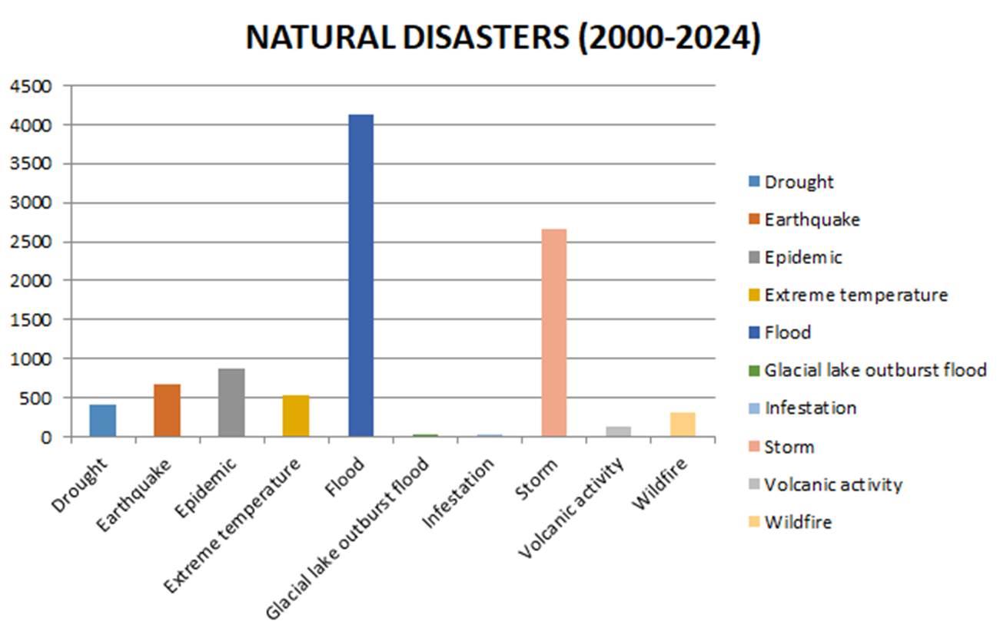

Flooding in Kenya affects close to 60% of the population leading to loss of lives and livelihoods, destroying infrastructure and leading to waterborne disease outbreaks. As is the case in many developing countries, majority of the damage is uninsured exacerbating the impact. With the increasing effects of climate change, frequency of flood events is bound to increase with devastating impacts to lives and livelihoods.

Therfore, flood extent mapping is a critical operation with the resultant flood maps offering decision support tools for humanitarian relief organizations, disaster management stakeholders and insurance companies.

# **Problem Statement**

Effective flood risk reduction necessitates near real-time inundation mapping.  **Synthetic Aperture Radar (SAR)** images offer the ‘best solution’ for near-realtime flood extent mapping due to:
1.	“All Weather” properties
2.	Day & Night capabilities
3.	Penetration through canopy, soil (Frequency dependent)

However, the post flood event AOI presents a complex environment that varies from water to the different inundated rural or urban land cover types. This results in different signal to surface interaction mechanisms thus affecting accurate SAR image classification.

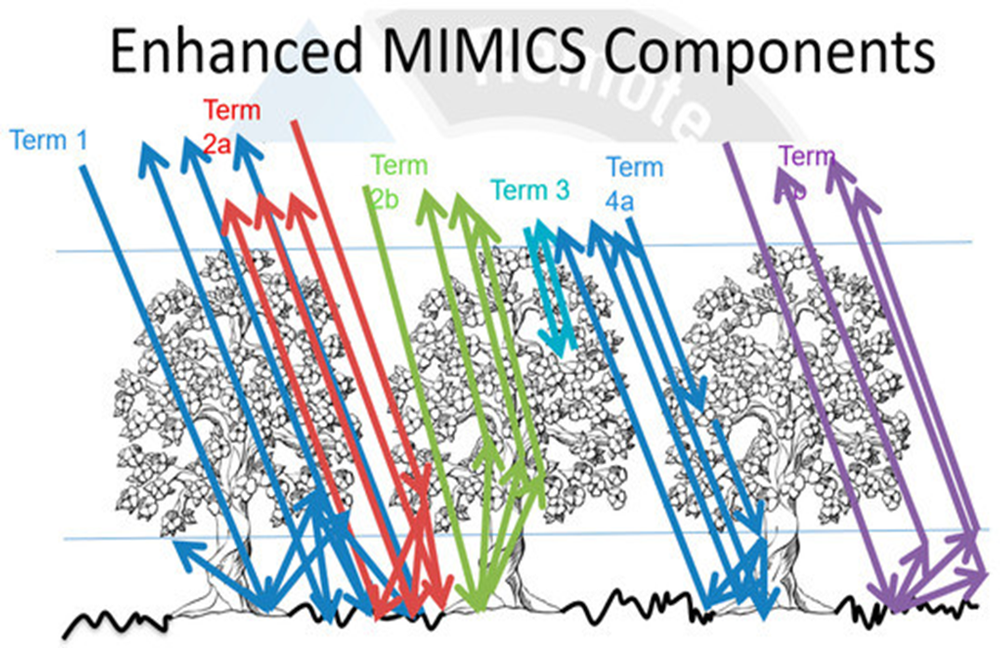


## **Solution**

Overcoming these SAR shortcomings necessitates:

1.	SAR water detection approaches e.g. thresholding, change detection, segmentation, ML/DL etc.
2.	Multi-sensor data fusion leveraging capabilities of alternative datasets such as:

    i. Multi-spectral

    ii. Hyper-spectral

    iii. GNSS-R

    iv. Different wavelengths of SAR


## **Objectives**

This study aims to use Copernicus Program datasets (Sentinel 1 & 2 and DEM) in Google Earth Engine (GEE) to:

1.	Test the application of Sentinel-1 C-band SAR imagery for water detection in a complex land cover environment.
2.	Compare the performance of Sentinel-1 VH against VV for water extent mapping in complex land cover.
3.	Test a thresholding SAR based water detection approach (Otsu).
4.	Test a SAR change detection flood extent mapping approach.
5. Test a Hybrid (Otsu + Change Detection) flood extent mapping approach.

The pipeline is divided into three (3) main parts:

    i. Sentinel-1 Flood Detection using the Otsu Thresholding Algorithm

    ii. Sentinel-1 Flood Detection using a multi-temporal SAR Change Detection Approach.

    iii. Sentinel-1 Flood Detection using a SAR based Hybrid (Otsu + Change Detection) Approach.

The entire workflow is replicated for the **VH** and the **VV** polarization channels.



### **GOOGLE EARTH ENGINE**
This study uses **Google Earth Engine (GEE)** a powerful cloud computing platform that enables global scale geospatial visualization and analysis.
The methodology is implemented on **Google Colab** using the GEE Python API and the **geemap python package**.


First we need to prepare the GEE Python API environment dependencies.

In [1]:
# Import the Earth Engine
import ee
#geemap.get_ee_token()
ee.Authenticate() # log in to GEE
ee.Initialize(project="ee-davidmwendamuriithi")   # connect to a GEE cloud projects
# Import the geemap package
import geemap
from geemap import chart

## **Area of Study**
Tana River is Kenya’s longest river covering approximately 1000 Km. The Tana Delta is formed in the lower regions of the Tana River Basin as the river enters the Indian Ocean covering approximately 130,000Ha. A Ramsar Site, the Tana Delta is a productive coastal ecosystem comprising of a unique mix of fresh water, floodplain, estuarine areas and beaches supporting several ecosystem services.
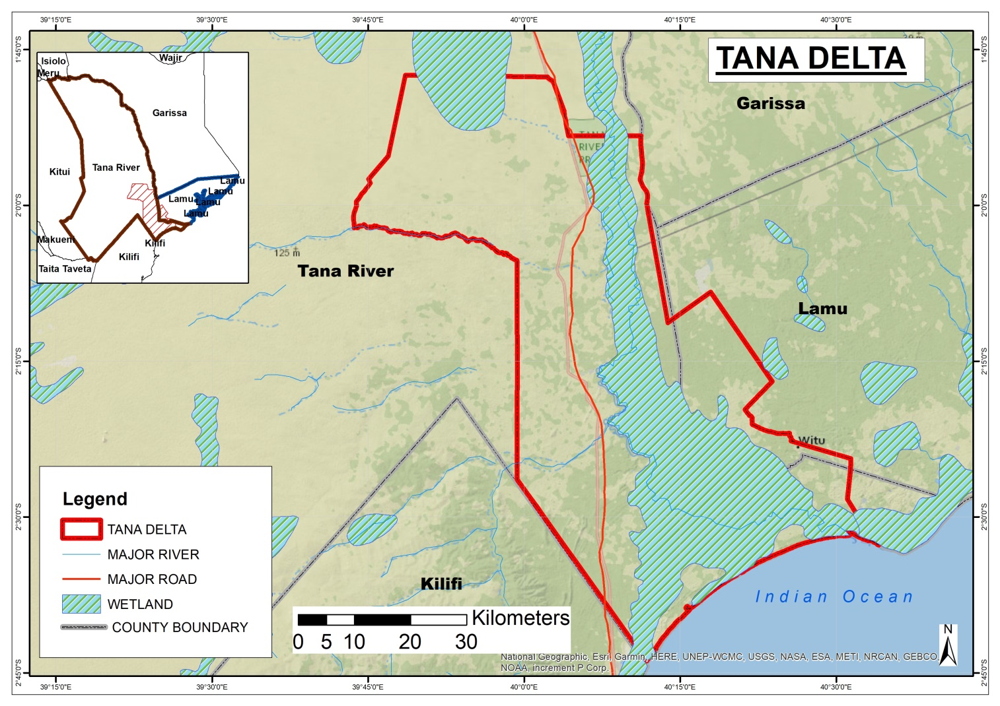

## **Case Study**: April 2024 Tana Delta Flooding Event
Kenya has two (2) rainy seasons during which flood risk is at its highest, the March-April-May (MAM) long rains and the October-November-December (OND) short rains seasons.

In 2024, the country experienced above average rainfall in the MAM season leading to widespread flooding events. The [Kenya Red Cross](https://www.redcross.or.ke/floods/) recorded floods in 43 out of the 47 counties with about 294 fatalities reported. Tana River County was on of the most affected counties especially in the flood prone Tana Delta.

With no clear date for event's onset this study uses the month of April 2024 as the post flood epoch.

 Confirm that the geemap import was successful by displaying a basemap and the area of interest

In [2]:
# Define the area of interest (AOI) from a GEE asset
aoi = ee.FeatureCollection("projects/ee-davidmwendamuriithi/assets/TanaDelta")
m = geemap.Map()
m.add_layer(aoi, {}, 'AOI', False)
m.centerObject( aoi, 12)
m

Map(center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['position', 'transparent…

## **Datasets**
This study mainly uses three (3) products of Copernicus, the Earth Observation (EO) component of the European Union (EU) Space Program namely:

1.	**Sentinel-1 (S1)**: This is C-band synthetic aperture radar (SAR) mission designed to offer radar vision for Copernicus through all weather, day and night radar imagery. Currently the sentinel-1 constellation is made up of two satellites, that is, Sentinel-1A (launched in April 2014), and Sentinel-1C (Launched in December 2024). Sentinel-1B which was launched in April 2016 was decommissioned in December 2021 following an anomaly attributed to the instrument’s electronics power supply. Additionally, Sentinel-1D is under development and scheduled for launch in 2025.
2.	**Sentinel-2 (S2)**: This optical mission features three satellites, Sentinel-2A (launched in June 2015), Sentinel-2B (launched in March 2017) and Sentinel-2C (launched in September 2024) carrying a wide swath high resolution multispectral (13 bands) imager with a fourth satellite foreseen in the future.
3. **Copernicus DEM GLO-30**: Global 30m Digital Elevation Model

In particular, the following datasets available on the GEE platform were used for this study:


*   [Sentinel-1 SAR GRD: C-band Synthetic Aperture Radar Ground Range Detected, log scaling](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S1_GRD#description)
*   [Harmonized Sentinel-2 MSI: MultiSpectral Instrument, Level-2A (SR) ](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2_SR_HARMONIZED?hl=en)
* [Copernicus DEM GLO-30](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_DEM_GLO30)




## **Sentinel-1 SAR Ground Range Detected (GRD) Dataset**
The [Sentinel-1 SAR GRD ](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S1_GRD) dataset contains ground range detected images pre-processed using the Sentinel-1 Toolbox steps for Thermal Noise Removal, Radiometric Calibration and Terrain Correction.
The collection is divided into two collections namely:

1. **COPERNICUS/S1_GRD_FLOAT**: ground range detected images with raw power values. This dataset is updated faster on GEE.
2. **COPERNICUS/S1_GRD**: ground range detected images converted to decibels and computed on the fly.

## **Edge Masking**
The Sentinel-1 image composite may comprise of images from different scenes. Consequently, there may be differences especially at the inter-scene boundaries which may affect the appearance of our composite image thus necessitating edge matching.
Since we are working with a large area of interest we need to define an edge matching function.


In [3]:
# define a function to match edges between two scenes
def mask_edge(image):
  edge = image.lt(-50.0)
  masked_image = image.mask().And(edge.Not())
  return image.updateMask(masked_image)


### **Sentinel-1**- COPERNICUS/S1_GRD
First we import the **COPERNICUS/S1_GRD** collection filtered for the ascending pass,restricted to the area of interest and applying the edge masking function

In [4]:
# import the sentinel 1 image collection
tana_db = (
    ee.ImageCollection('COPERNICUS/S1_GRD')
    #filter to the area of study
    .filterBounds(aoi)
    # filter for the ascending pass
    .filter(ee.Filter.eq('orbitProperties_pass', 'ASCENDING'))
    # perform edge matching for aoi covering >1 scenes
    .map(mask_edge)
     )



### **Sentinel 2**-COPERNICUS/S2_SR_HARMONIZED

In [5]:
tana_s2 = (
ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
 # filter to limit collection to the area of study
.filterBounds(aoi)
# filter for less cloudy images
.filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 50))
)

### **Copernicus DEM GLO-30**: Global 30m Digital Elevation Model
The [Copernicus DEM ](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_DEM_GLO30#description) is a global Digital Surface Model (DSM) which represents the surface of the Earth including buildings, infrastructure and vegetation. In this study it is used to generate slope in the post processing step.

In [6]:
# import the Copernicus 30m DSM collection from GEE
dem = ee.ImageCollection('COPERNICUS/DEM/GLO30')
# select the DEM band and get the median elevatio image
elevation = dem.select('DEM').median()
# define the DEM visualisation parameters
elevationVis = {
    'min': 0.0,
    'max': 5000.0,
    'palette': ['#0000ff','#00ffff','#ffff00','#ff0000','#ffffff']
    }

# add the elevation layer to the map with a 0.5 opacity setting
m.add_layer(elevation, elevationVis, 'DEM', False, 0.5)
m

Map(bottom=531110.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Post Processing**
In order to refine the detected flood extent, we need to mask out the **permanent/perennial surface water**. This is achieved using the MNDWI derived from a median composite of the Sentinel-2 Image collection.

Pixel based classification classifies each pixel individually without taking into consideration the pixel's **spatial context**. This results in  *salt and pepper* noise in the classification result that necessitates post-processing.

In this case,the identified flooded area has some noise which appear as very small flood pixels. To correct for this noise we introduce two conditions namely:


*   **Connectivity** - Checks whether the flood pixel is connected to flooded neighbours or is an isolated noisy pixel. Isolated pixels are replaced with the value of neighbouring pixels.
*   **Slope** - Using a *DEM* generated slope image flood pixels with high slope values are masked out.



### **Permanent Water Definition using Sentinel-2**
In order to determine the flooded pixels, we need to reduce permanent water bodies like rivers or lakes from water mask.
To determine the permanent water, we use the Modified Normalized Difference Water Index of a median composite image of the entire Sentinel-2 collection for our AOI.



In [7]:
tana_s2_median = (tana_s2
.filterDate('2016-01-01', '2024-01-30')
.median()
.clip(aoi)
)
s2_vis = {
    'min': 0.0,
    'max': 3000,
    'bands': ['B4', 'B3', 'B2'],
}

mmm = geemap.Map()
mmm.center_object(aoi, 10)
mmm.add_layer(tana_s2_median, s2_vis, 'S2 RGB', False)
mmm

Map(center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['position', 'transparent…

We define the MNDWI using the Green (B3) and SWIR 1 (B11) bands

In [8]:
mndwi = tana_s2_median.normalizedDifference(['B3', 'B11']).rename('MNDWI')
mmm.add_layer(mndwi, {'min': 0, 'max': 1, 'palette': ['white','blue']}, 'MNDWI')
mmm

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

For this study we define permanent water as any pixel with an MNDWI value greater then zero.

In [9]:
#define the permanent water mask
permanent_water = mndwi.gt(0)
permanent_water = permanent_water.selfMask()
mmm.add_layer(permanent_water, {'palette':['green']}, 'Permanent Water', True)
mmm

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Connectivity Condition**
We define a function that masks out flood pixels with less than eight flooded neighbouring pixels

In [10]:
# Connectivity condition
def connectivity(image):
  neighbours = image.connectedPixelCount()
  return image.updateMask(neighbours.gte(8))


### **Slope Condition**
We define a function that masks out flood pixels above the threshold slope.

In [11]:
# Slope condition
def slope_condition(image):
  terrain = ee.Algorithms.Terrain(elevation)
  slope = terrain.select('slope')
  slope_threshold = 5
  return image.updateMask(slope.lt(slope_threshold))


### **Sentinel-1 & 2 Image Selection**
Ideally, images acquired on the same date should be used for this study. However, a review of the available images for April 2024 returned the following.

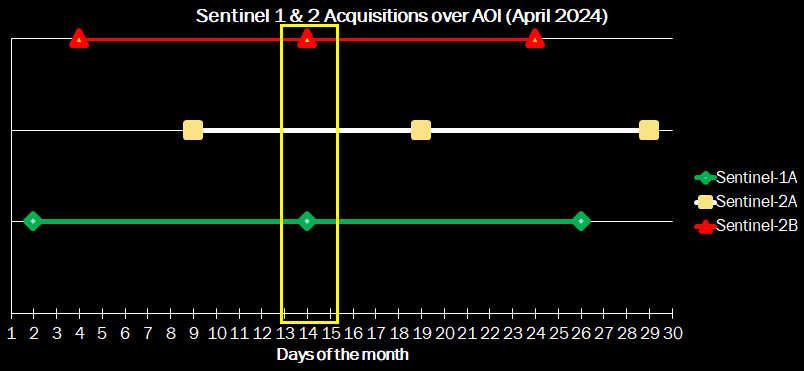

However, of all the available Sentinel-2 images, the one with least cloud percentage cover  was the image of 29th April 2024.   

Consequently, the study used the Sentinel-1 image of 26th April 2024 validated against the Sentinel-2 image of 29th April 2024.


### **Assumption**
No significant land cover change took place between the 26th and 29th April 2024.

## **Sentinel-1 Imagery**
Two S1 composite images are used for this study:


1.   **Reference Image** (Pre-flood) - A median composite of the February 2024 Sentinel-1 archive.
2.   **Crisis Image** (Post-flood) - A median composite of the 26th April 2024 Sentinel-1 scenes.



In [12]:
# reference Sentine-1 image February 2024 composite
s1_ref = tana_db.filterDate('2024-02-01', '2024-02-29').median().clip(aoi).focalMean(50, 'circle','meters')
# crisis sentinel-1 image 26th April 2024
s1_post = tana_db.filterDate('2024-04-26', '2024-04-30').median().clip(aoi).focalMean(50, 'circle','meters')
# define the visualization parameters
vis_par = {'min': -25, 'max': 5}
# define new map variable
mm = geemap.Map()
# display the reference VV image
mm.add_layer(s1_ref.select('VV'), vis_par, 'Reference VV', False)
# display the reference VH image
mm.add_layer(s1_ref.select('VH'), vis_par, 'Reference VH', False)
# display the crisis VV image
mm.add_layer(s1_post.select('VV'), vis_par, 'Crisis VV', False)
# display the crisis VH image
mm.add_layer(s1_post.select('VH'), vis_par, 'Crisis VH', False)
mm.centerObject(aoi, 10)
mm

Map(center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['position', 'transparent…

## **RGB False Composite Images**
The default greyscale SAR images are not easy to interpret for the untrained eye. In order to improve the visualization, we display the images in a false color RGB where the Red channel is the VV Band, Green is the VH Band and the Blue channel is a ratio of the two bands (VV/VH).

Resultantly, water appears dark red (black), urban areas are shown in yellow, vegetated areas in turquoise and bare ground in dark purple.

In [13]:
def addRatioBand(image):
    ratioBand = image.select('VV').divide(image.select('VH')).rename('VV/VH')
    return image.addBands(ratioBand)

before = s1_ref.select('VV','VH')
after = s1_post.select('VV','VH')

beforeRgb = addRatioBand(before)
afterRgb = addRatioBand(after)
visParams = {
    'min' : [-25, -25, 0],
    'max' : [0, 0, 3]
    }
mm.add_layer(beforeRgb, visParams, 'Before RGB', False)
mm.add_layer(afterRgb, visParams, 'After RGB', False)
mm.centerObject(aoi, 8)
mm

Map(bottom=66677.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positio…

## **Image Histograms**

### **Reference Image Histogram**
display the reference image histogram

In [14]:
# display the reference image histogram
s1_hist_ref = chart.image_histogram(
    s1_ref.select('VV','VH'),
    aoi,
    scale=10,
    max_buckets=1000,
    min_bucket_width=0.1,
    max_raw=1000,
    max_pixels=int(1e13),
    title="Sentinel-1 GRD Reference Image Histogram",
    labels=["VV","VH"],
    colors=["#cf513e","#1d6b99"],


)
s1_hist_ref

Figure(axes=[Axis(label='Reflectance (x1e4)', scale=LinearScale(), tick_format='0.0f'), Axis(label='Count', or…

## **Crisis Image Histogram**
Display the crisis image histogram

In [15]:
# display the crisis image histogram
s1_hist_post = chart.image_histogram(
    s1_post.select('VV','VH'),
    aoi,
    scale=10,
    max_buckets=1000,
    min_bucket_width=0.1,
    max_raw=1000,
    max_pixels=int(1e13),
    title="Sentinel-1 GRD Crisis Image Histogram",
    labels=["VV","VH"],
    colors=["#cf513e","#1d6b99"],


)
s1_hist_post

Figure(axes=[Axis(label='Reflectance (x1e4)', scale=LinearScale(), tick_format='0.0f'), Axis(label='Count', or…

# 1.  **Sentinel-1 Flood Detection using the Otsu Thresholding Algorithm**
## **Methodology**
The workflow, implemented on the **Google Earth Engine (GEE)** Javascript API entails a threshold binarization approach (Otsu) applied on the Sentinel-1 SAR. This is applied on the post event S1 image and done both for the VH and VV bands generating two water masks.

To compare the water detection results, a Sentinel-2 MSI surface reflectance image is classified (Random Forest Supervised Classification) into four (4) classes (Urban, Bare, Water and Vegetation) and used as the validation dataset.

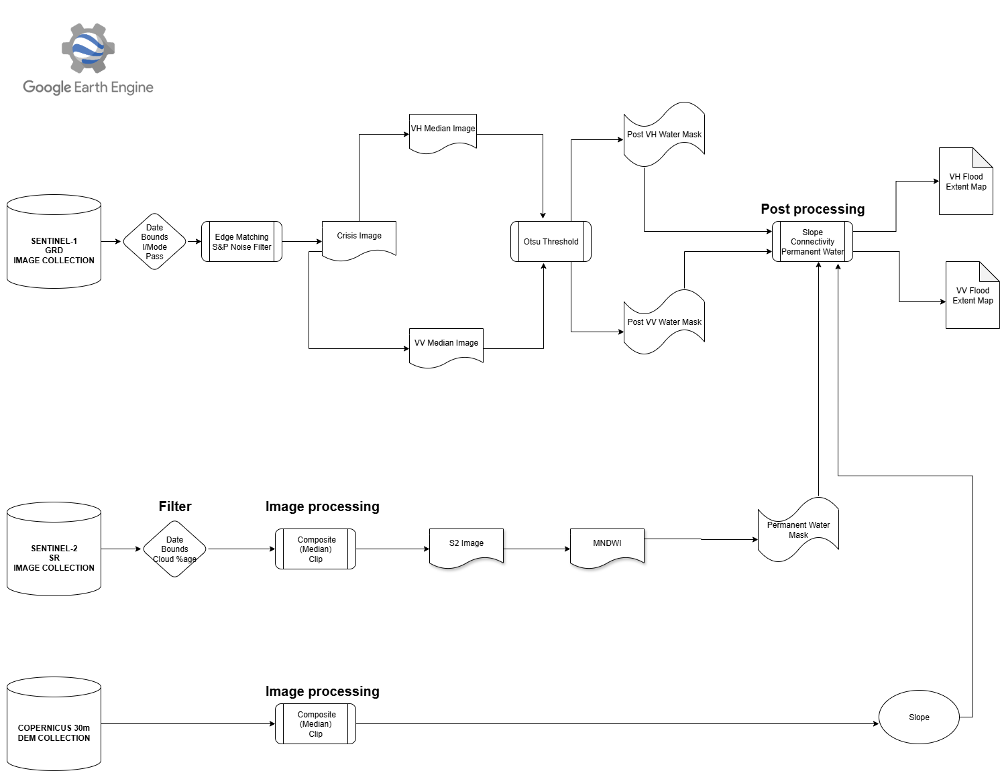

### **Otsu Thresholding Image Segmentation Method**
**Otsu Thresholding** is an automatic image thresholding method used to determine the optimal threshold that effectively divides pixels into two distinct classes. That is the threshold that minimizes the variance within each class (minimizes intra-class variance) and equivalently maximizes the variance between the two classes (Maximizes inter-class variance).

First we need to define an Otsu Thresholding function.

In [16]:
# Return the DN that maximizes interclass variance (Otsu).
def otsu(histogram):
    # Array of the pixel count in each bucket
    counts = ee.Array(ee.Dictionary(histogram).get('histogram'))
     # Array of the mean value for each bucket
    means = ee.Array(ee.Dictionary(histogram).get('bucketMeans'))
    # The number of buckets
    size = means.length().get([0])
    # The total number of pixels
    total = counts.reduce(ee.Reducer.sum(), [0]).get([0])
    # Sum of all mean values
    sum = means.multiply(counts).reduce(ee.Reducer.sum(), [0]).get([0])
    #  Mean value for the whole image
    mean = sum.divide(total)

    # A list from 1 to the numbeer of buckets
    indices = ee.List.sequence(1, size)
    # Compute between-sum-of-squares (BSS) for different thresholds, one per bucket i.e. where each mean partitions the data.Later on, we'll pick the best of these
    def function(i):
      # Array of pixel count i.e.  When i = 1, aCounts = [counts[0]], when i = 2, aCounts = [counts[0], counts[1]] etc
      aCounts = counts.slice(0, 0, i)
      # Pixel count for class A
      aCount = aCounts.reduce(ee.Reducer.sum(), [0]).get([0])
      #  similar to aCounts, but with the means
      aMeans = means.slice(0, 0, i)
      # Mean for class A
      aMean = aMeans.multiply(aCounts).reduce(ee.Reducer.sum(), [0]).get([0]).divide(aCount)
      # Pixel count for class B
      bCount = total.subtract(aCount)
      # Mean for class B
      bMean = sum.subtract(aCount.multiply(aMean)).divide(bCount)
      # Calculate BSS for p = 2.
      return aCount.multiply(aMean.subtract(mean).pow(2)).add(bCount.multiply(bMean.subtract(mean).pow(2)))

    bss = indices.map(function)

    # print(ui.Chart.array.values(ee.Array(bss), 0, means))

    # Return the mean value corresponding to the maximum BSS.
    return means.sort(bss).get([-1])


First we need to compute the  crisis image VH and VV histograms. However, the Otsu Thresholding algorithm works best for images with a bimodal histogram. Therefore we take a small area of our AOI that on average has equal water and non water pixels.

In [17]:
#define a subset of AOI
otsu_aoi = ee.FeatureCollection('projects/ee-davidmwendamuriithi/assets/TanaRiverAOI')
# clip the Crisis Image
otsu_s1_post = s1_post.clip(otsu_aoi)
# display the crisis VV image
mm.add_layer(otsu_s1_post.select('VV'), vis_par, 'Otsu Crisis VV', False)
# display the crisis VH image
mm.add_layer(otsu_s1_post.select('VH'), vis_par, 'Otsu Crisis VH', False)
mm.centerObject(aoi, 10)
mm

Map(bottom=66675.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positio…

### **VH Image Binarization**
First we need to compute the VH histogram statistics

In [18]:
histogram_post_VH =  otsu_s1_post.select('VH').reduceRegion(
    reducer= ee.Reducer.histogram(255, 2).combine('mean', None, True).combine('variance', None, True),
    geometry= otsu_aoi,
    scale= 10,
    bestEffort= True
)
histogram_post_VH

Then we run the Otsu function and display the threshold value

In [19]:
threshold_post_VH = otsu(histogram_post_VH.get('VH_histogram'))
threshold_post_VH

Now we define a binary mask where all values below the threshold are classified as water.

In [20]:
post_water_vh = s1_post.select('VH').lt(threshold_post_VH)
post_water_vh = post_water_vh.selfMask()
mm.add_layer(post_water_vh, {'palette':['blue']}, 'VH Crisis Image Water Mask', False)
mm


Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

Now we introduce the permanent water, connectivity and slope post-processing conditions.

In [21]:
otsu_flood_mask_vh = post_water_vh.where(permanent_water,0)
otsu_flood_mask_vh = connectivity(otsu_flood_mask_vh).selfMask()
otsu_flood_mask_vh = slope_condition(otsu_flood_mask_vh).selfMask()
mm.add_layer(otsu_flood_mask_vh, {'palette':['green']}, 'VH Flood Mask', False)
mm

Map(bottom=66666.0, center=[-2.2790618517710675, 40.175628662109375], controls=(WidgetControl(options=['positi…

### **VH Flood Mask Area**
Now we can estimate the area of the flood extent.

In [ ]:
otsu_flood_mask_vh = geemap.image_area_by_group(
    otsu_flood_mask_vh, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
otsu_flood_mask_vh

Calculating area for group 1 ...


,area,percentage
group,,
1,240.8453,1.0


In [ ]:
#calculate the water area detected by VH channel
post_water_vh_area = otsu_flood_mask_vh.multiply(ee.Image.pixelArea())
post_water_vh_stats = post_water_vh_area.reduceRegion(
    reducer = ee.Reducer.sum(),
    geometry = aoi,
    scale = 30,
    #bestEffort = True,
    maxPixels = 1e30,
    tileScale = 16
    )
final_post_water_area_vh = post_water_vh_stats.getNumber("VH").divide(1e6)
final_post_water_area_vh

### **VV Image Binarization**
We repeat the above procedure for the VV Polarization Image.

In [22]:
histogram_post_VV =  otsu_s1_post.select('VV').reduceRegion(
    reducer= ee.Reducer.histogram(255, 2).combine('mean', None, True).combine('variance', None, True),
    geometry= otsu_aoi,
    scale= 10,
    bestEffort= True
)
histogram_post_VV

Apply the Otsu function.

In [23]:
threshold_post_VV = otsu(histogram_post_VV.get('VV_histogram'))
threshold_post_VV

Next we define a binary mask where all values below the threshold are classified as water.

In [24]:
post_water_vv = s1_post.select('VV').lt(threshold_post_VV)
post_water_vv = post_water_vv.updateMask(post_water_vv)
mm.add_layer(post_water_vv, {'palette':['gold']}, 'VV Crisis Image Water Mask', False)
mm

Map(bottom=66682.0, center=[-2.3229717293301575, 39.571380615234375], controls=(WidgetControl(options=['positi…

Now we introduce the permanent water, connectivity and slope post-processing conditions.

In [25]:
otsu_flood_mask_vv = post_water_vv.where(permanent_water,0)
otsu_flood_mask_vv = connectivity(otsu_flood_mask_vv).selfMask()
otsu_flood_mask_vv = slope_condition(otsu_flood_mask_vv).selfMask()
mm.add_layer(otsu_flood_mask_vv, {'palette':['maroon']}, 'VV Flood Mask', False)
mm

Map(bottom=133143.0, center=[-2.4313683408148594, 40.019760131835945], controls=(WidgetControl(options=['posit…

### **VV Water Mask Area**
Now we can estimate the area classified as water.

In [ ]:
otsu_flood_mask_vv = geemap.image_area_by_group(
    otsu_flood_mask_vv, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
otsu_flood_mask_vv

Calculating area for group 1 ...


,area,percentage
group,,
1,196.9771,1.0


In [ ]:
#calculate the water area detected by VV channel
post_water_vv_area = otsu_flood_mask_vv.multiply(ee.Image.pixelArea())
post_water_vv_stats = post_water_vv_area.reduceRegion(
    reducer = ee.Reducer.sum(),
    geometry = aoi,
    scale = 30,
    #bestEffort = True,
    maxPixels = 1e15,
    tileScale = 16
    )
final_post_water_area_vv = post_water_vv_stats.getNumber("VV").divide(1e6)
final_post_water_area_vv

# 2. **Sentinel-1 Flood Detection using a multi-temporal SAR Change Detection Approach**

  


## **Methodology**
The methodology implemented on the **Google Earth Engine Python API** involves performing a change detection on the Sentinel-1 pre-flood and post flood images. Subsequently, the flood mask is refined by removing permanent water pixels identified from the Modified Normalized Water Index (MNDWI) of the mean composite of the entire Sentinel-2 collection. Finally post processing is done by introducing a pixel neighbourhood connectivity and slope conditions.

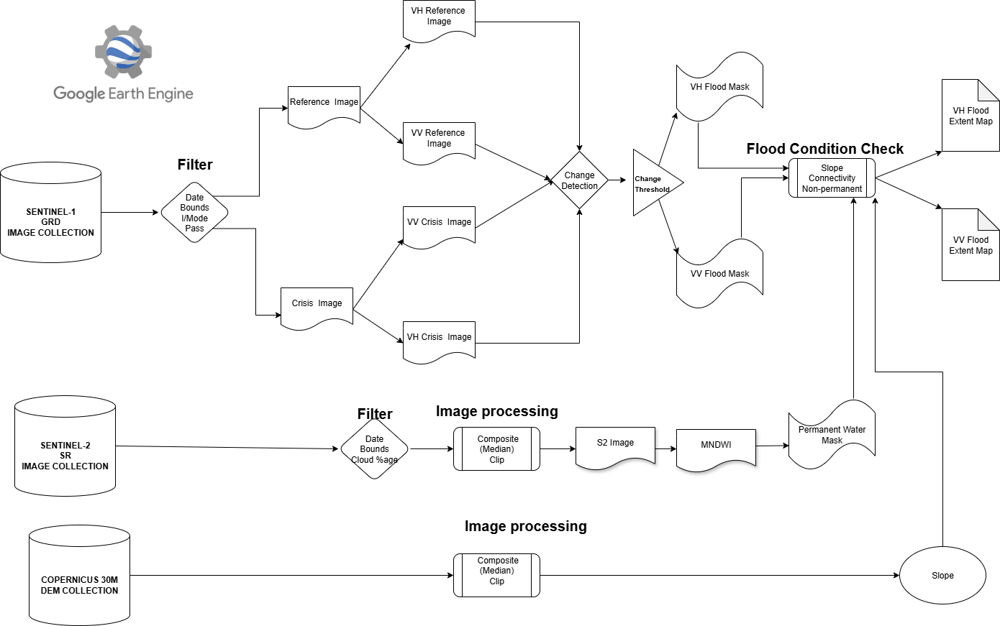

This approach seeks to identify flooded pixels by determining areas of significant change between two multi-temporal SAR images acquired before and after the flood event.

First we define a new map and visualize the Reference and Crisis  Sentinel-1 images.


In [26]:
# reference Sentine-1 db image February 2024 composite
s1_ref_db = tana_db.filterDate('2024-02-01', '2024-02-29').median().clip(aoi).focalMean(50, 'circle','meters')
# crisis sentinel-1 db image 26th April 2024
s1_post_db = tana_db.filterDate('2024-04-26', '2024-04-30').median().clip(aoi).focalMean(50, 'circle','meters')

In [27]:
# define new map variable
cd = geemap.Map()
# display the reference VV image
cd.add_layer(s1_ref.select('VV'), vis_par, 'Reference VV', True)
# display the reference VH image
cd.add_layer(s1_ref.select('VH'), vis_par, 'Reference VH', True)
# display the crisis VV image
cd.add_layer(s1_post.select('VV'), vis_par, 'Crisis VV', True)
# display the crisis VH image
cd.add_layer(s1_post.select('VH'), vis_par, 'Crisis VH', True)
cd.centerObject(aoi, 10)
cd

Map(center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['position', 'transparent…

# **Change Detection**
In order to test whether a change occurred between the two periods of interest, we take the quotient of the Reference Image and the Crisis Image.  For every pixel, the result gives a likelihood ratio test statistic for deciding whether or not a change has occurred between the two acquisition dates at that position.



### **VV Image Change Detection**

In [28]:
change_vv = s1_post_db.select('VV').divide(s1_ref_db.select('VV'))
cd.add_layer(change_vv, {'min': 0, 'max': 2, 'palette': ['black', 'white']}, 'VV Change', True)
cd

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **VH Image Change Detection**

In [29]:
change_vh = s1_post_db.select('VH').divide(s1_ref_db.select('VH'))
cd.add_layer(change_vh, {'min': 0, 'max': 2, 'palette': ['black', 'white']}, 'VH Change', True)
cd

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

The brighter pixels represent areas where positive change occurred after the reference date.

Since this change is not only as a result of flooding, we need to find the threshold for the significant changes associated with the flood event.

For this instance we go with an arbitrary threshold of **1.5**.

In [58]:
#define the threshold
change_threshold = 1.5


### **VV flood mask from SAR Change Detection**

In [59]:
cd_water_vv = change_vv.gt(change_threshold)
cd_water_vv = cd_water_vv.updateMask(cd_water_vv)
cd.add_layer(cd_water_vv, {'palette':['red']}, 'VV Flood Mask', True)
cd

Map(bottom=531811.0, center=[-2.4790463943682517, 40.38797378540039], controls=(WidgetControl(options=['positi…

### **VH flood mask from SAR Change Detection**

In [60]:
cd_water_vh = change_vh.gt(change_threshold)
cd_water_vh = cd_water_vh.updateMask(cd_water_vh)
cd.add_layer(cd_water_vh, {'palette':['violet']}, 'VH Flood Mask', True)
cd

Map(bottom=531811.0, center=[-2.4790463943682517, 40.38797378540039], controls=(WidgetControl(options=['positi…

Now we introduce the permanent water, connectivity and slope post-processing conditions.

### **Refined VV Flood Mask**

In [61]:


cd_flood_mask_vv = cd_water_vv.where(permanent_water,0)
cd_flood_mask_vv = connectivity(cd_flood_mask_vv).selfMask()
cd_flood_mask_vv = slope_condition(cd_flood_mask_vv).selfMask()
cd.add_layer(cd_flood_mask_vv, {'palette':['cyan']}, 'CD Refined VV Flood Mask', False)
cd

Map(bottom=531811.0, center=[-2.4790463943682517, 40.38797378540039], controls=(WidgetControl(options=['positi…

### **Refined VH Flood Mask**

In [62]:
cd_flood_mask_vh = cd_water_vh.where(permanent_water,0)
cd_flood_mask_vh = connectivity(cd_flood_mask_vh).selfMask()
cd_flood_mask_vh = slope_condition(cd_flood_mask_vh).selfMask()
cd.add_layer(cd_flood_mask_vh, {'palette':['indigo']}, 'CD Refined VH Flood Mask', False)
cd

Map(bottom=531811.0, center=[-2.4790463943682517, 40.38797378540039], controls=(WidgetControl(options=['positi…

### **VV Flood Area**

In [ ]:
cd_flood_mask_vv = geemap.image_area_by_group(
    cd_flood_mask_vv, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
cd_flood_mask_vv

In [ ]:
#calculate the area of the water detected by VV
flood_vv_area = cd_flood_mask_vv.multiply(ee.Image.pixelArea())
flood_vv_stats = flood_vv_area.reduceRegion(
    reducer = ee.Reducer.sum(),
    geometry = aoi,
    scale = 30,
    #bestEffort = True,
    maxPixels = 1e15,
    tileScale = 16
    )
area_vv = flood_vv_stats.getNumber('VV').divide(1e6)
area_vv

### **VH Flood Area**

In [ ]:
cd_flood_mask_vh = geemap.image_area_by_group(
    cd_flood_mask_vh, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
cd_flood_mask_vh

Calculating area for group 1 ...


,area,percentage
group,,
1,40.6379,1.0


In [ ]:
#calculate the area of the water detected by VH change detection
flood_vh_area = cd_flood_mask_vh.multiply(ee.Image.pixelArea())
flood_vh_stats = flood_vh_area.reduceRegion(
    reducer = ee.Reducer.sum(),
    geometry = aoi,
    scale = 30,
    #bestEffort = True,
    maxPixels = 1e15,
    tileScale = 16
    )
area_vh = flood_vh_stats.getNumber('VH').divide(1e6)
area_vh

 # 3. **Sentinel-1 Flood Detection using a SAR based Hybrid (Otsu + Change Detection) Approach.**
In order to reduce the false positives from the Otsu and change detection approaches, a hybrid approach is proposed. This involves performing the Otsu Thresholding for a Reference image and Post flood image. Subsiquently, CD will be applied on the resultant pre and post flood binary images.

### **Reference and Crisis Composite Images**

In [35]:
# reference Sentine-1 image February 2024 composite
s1_ref = tana_db.filterDate('2024-02-01', '2024-02-29').median().clip(aoi).focalMean(30, 'circle','meters')

# # crisis sentinel-1 image 26th April 2024
s1_post = tana_db.filterDate('2024-04-26', '2024-04-30').median().clip(aoi).focalMean(30, 'circle','meters')

### **Reference VH Image**

In [36]:

# display the reference VH image
h = geemap.Map()
h.add_layer(s1_ref.select('VH'), vis_par, 'Reference VH', True)
h.centerObject(aoi, 8)
h

Map(center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['position', 'transparent…

### **Reference VV Image**

In [37]:
# display the reference VV image
h.add_layer(s1_ref.select('VV'), vis_par, 'Reference VV', True)
h.centerObject(aoi, 8)
h

Map(bottom=33476.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positio…

### **Crisis VH Image**

In [38]:
# display the crisis VH image
h.add_layer(s1_post.select('VH'), vis_par, 'Crisis VH', True)
h.centerObject(aoi, 8)
h

Map(bottom=33476.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positio…

### **Crisis VV Image**

In [39]:
# display the crisis VV image
h.add_layer(s1_post.select('VV'), vis_par, 'Crisis VV', True)
h.centerObject(aoi, 8)
h

Map(bottom=33476.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positio…

### **Otsu Threshold**
Once again we use a small area of the AOI to get the threshold.

### **Crisis Image Otsu Subset**
We use the subset defined earlier in **Part 1**  

In [40]:

# display the crisis VV image
h.add_layer(otsu_s1_post.select('VV'), vis_par, 'Otsu Crisis VV', False)
# display the crisis VH image
h.add_layer(otsu_s1_post.select('VH'), vis_par, 'Otsu Crisis VH', False)
h.centerObject(aoi, 10)
h

Map(bottom=33476.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positio…

### **Reference Image Otsu Subset**
We define a subset for the reference image.

In [41]:
# clip the Ref Image
otsu_s1_ref = s1_ref.clip(otsu_aoi)
# display the ref VV image
h.add_layer(otsu_s1_ref.select('VV'), vis_par, 'Otsu Ref VV', False)
# display the crisis VH image
h.add_layer(otsu_s1_ref.select('VH'), vis_par, 'Otsu Ref VH', False)
h.centerObject(aoi, 10)
h

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Reference Image VH Otsu Threshold**
First we compute the histogram of the reference VH Band.

In [42]:
histogram_ref_VH =  otsu_s1_ref.select('VH').reduceRegion(
    reducer= ee.Reducer.histogram(255, 2).combine('mean', None, True).combine('variance', None, True),
    geometry= otsu_aoi,
    scale= 10,
    bestEffort= True
)
histogram_ref_VH

Then we apply the Otsu Threshold function.

In [43]:
threshold_ref_VH = otsu(histogram_ref_VH.get('VH_histogram'))
threshold_ref_VH

### **Reference Image VV Otsu Threshold**
Next we compute the histogram of the reference VV Band.

In [44]:
histogram_ref_VV =  otsu_s1_ref.select('VV').reduceRegion(
    reducer= ee.Reducer.histogram(255, 2).combine('mean', None, True).combine('variance', None, True),
    geometry= otsu_aoi,
    scale= 10,
    bestEffort= True
)
histogram_ref_VV

Then we apply the Otsu Threshold function.

In [45]:
threshold_ref_VV = otsu(histogram_ref_VV.get('VV_histogram'))
threshold_ref_VV

### **Crisis Image VH Otsu Threshold**
Next we compute the histogram of the crisis VH Band.

In [46]:
histogram_post_VH =  otsu_s1_post.select('VH').reduceRegion(
    reducer= ee.Reducer.histogram(255, 2).combine('mean', None, True).combine('variance', None, True),
    geometry= otsu_aoi,
    scale= 10,
    bestEffort= True
)
histogram_post_VH

Then we apply the Otsu Threshold function.

In [47]:
threshold_post_VH = otsu(histogram_post_VH.get('VH_histogram'))
threshold_post_VH

### **Crisis Image VV Otsu Threshold**
Next we compute the histogram of the crisis VV Band.

In [48]:
histogram_post_VV =  otsu_s1_post.select('VV').reduceRegion(
    reducer= ee.Reducer.histogram(255, 2).combine('mean', None, True).combine('variance', None, True),
    geometry= otsu_aoi,
    scale= 10,
    bestEffort= True
)
histogram_post_VV

Then we apply the Otsu Threshold function.

In [49]:
threshold_post_VV = otsu(histogram_post_VV.get('VV_histogram'))
threshold_post_VV

## **Reference & Crisis Image Binarization**
This is done by defining water masks where the water class is any value less than the calculated thresholds.

### **Reference Image VH Water Mask**

In [50]:
ref_water_vh = s1_ref.select('VH').lt(threshold_ref_VH)
#ref_water_vh = ref_water_vh.updateMask(ref_water_vh)
h.add_layer(ref_water_vh, {'palette':['white','violet']}, 'VH Ref Image Water', True)
h

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Reference Image VV Water Mask**

In [51]:
ref_water_vv = s1_ref.select('VV').lt(threshold_ref_VV)
#ref_water_vv = ref_water_vv.updateMask(ref_water_vv)
h.add_layer(ref_water_vv, {'palette':['white','red']}, 'VV Ref Image Water', True)
h

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Crisis Image VH Water Mask**

In [52]:
post_water_vh = s1_post.select('VH').lt(threshold_post_VH)
#post_water_vh = post_water_vh.updateMask(post_water_vh)
h.add_layer(post_water_vh, {'palette':['white','blue']}, 'VH Crisis Image Water', True)
h

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Crisis Image VV Water Mask**

In [53]:
post_water_vv = s1_post.select('VV').lt(threshold_post_VV)
#post_water_vv = post_water_vv.updateMask(post_water_vv)
h.add_layer(post_water_vv, {'palette':['white','black']}, 'VV Crisis Image Water', True)
h

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Change Detection Flood Extent Mapping Approach**
Change detection between respective reference & crisis band pairs is done to detect the flooded areas.

### **VH Flood Mask**

In [54]:
hbd_water_vh = post_water_vh.subtract(ref_water_vh)   # VH Change
hbd_water_vh = hbd_water_vh.selfMask()
hh = geemap.Map()
hh.add_layer(hbd_water_vh, {'palette':['darkorange']}, 'VH Flood Mask', False)
hh.centerObject(aoi, 10)
hh

Map(center=[-2.2384554812236734, 40.133002105406774], controls=(WidgetControl(options=['position', 'transparen…

### **VV Flood Mask**

In [55]:
hbd_water_vv = post_water_vv.subtract(ref_water_vv)  # VV Change
hbd_water_vv = hbd_water_vv.selfMask()
hh.add_layer(hbd_water_vv, {'palette':['steelblue']}, 'VV Flood Mask', False)
hh.centerObject(aoi, 10)
hh

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…


We refine the flood maps by introducing the post-processing conditions



### **Refined VH Flood Map**

In [56]:
hbd_flood_map_vh = hbd_water_vh.where(permanent_water,0)
hbd_flood_map_vh = connectivity(hbd_flood_map_vh).selfMask()
hbd_flood_map_vh = slope_condition(hbd_flood_map_vh).selfMask()
hh.add_layer(hbd_flood_map_vh, {'palette':['crimson']}, 'VH Hybrid Refined Flood Map', False)
hh

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

### **Refined VV Flood Map**

In [57]:
hbd_flood_map_vv = hbd_water_vv.where(permanent_water,0)
hbd_flood_map_vv = connectivity(hbd_flood_map_vv).selfMask()
hbd_flood_map_vv = slope_condition(hbd_flood_map_vv).selfMask()
hh.add_layer(hbd_flood_map_vv, {'palette':['olive']}, 'VV Hybrid Refined Flood Map', False)
hh

Map(bottom=133002.0, center=[-2.2384554812237045, 40.13300210540663], controls=(WidgetControl(options=['positi…

In [ ]:
hbd_class_area_vh = geemap.image_area_by_group(
    hbd_flood_map_vh, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
hbd_class_area_vh

Calculating area for group 1 ...


,area,percentage
group,,
1,143.6649,1.0


In [ ]:
#calculate the flood area detected by VH
flooded_vh_area = hbd_flood_map_vh.multiply(ee.Image.pixelArea())
flooded_vh_stats = flooded_vh_area.reduceRegion(
    reducer = ee.Reducer.sum(),
    geometry = aoi,
    scale = 30,
    #bestEffort = True,
    maxPixels = 1e15,
    tileScale = 16
    )
final_area_vh = flooded_vh_stats.getNumber('VH').divide(1e6)
final_area_vh

In [ ]:
hbd_class_area_vv = geemap.image_area_by_group(
    hbd_flood_map_vv, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
hbd_class_area_vv

Calculating area for group 1 ...


,area,percentage
group,,
1,47.332,1.0


In [ ]:
#calculate the flood area detected by VV
flooded_vv_area = hbd_flood_map_vv.multiply(ee.Image.pixelArea())
flooded_vv_stats = flooded_vv_area.reduceRegion(
    reducer = ee.Reducer.sum(),
    geometry = aoi,
    scale = 30,
    #bestEffort = True,
    maxPixels = 1e15,
    tileScale = 16
    )
final_area_vv = flooded_vv_stats.getNumber('VV').divide(1e6)
final_area_vv

# 4. **Sentinel-2 Flood Detection**
In order to validate our Sentinel-1 results, we classify the  Sentinel-2 Imagery acuired during our post-flood period of interest. From the review of Sentinel-2 image acquisitions over our area of interest in April 2024, the best post flood image was acquired on **29th April 2024**.



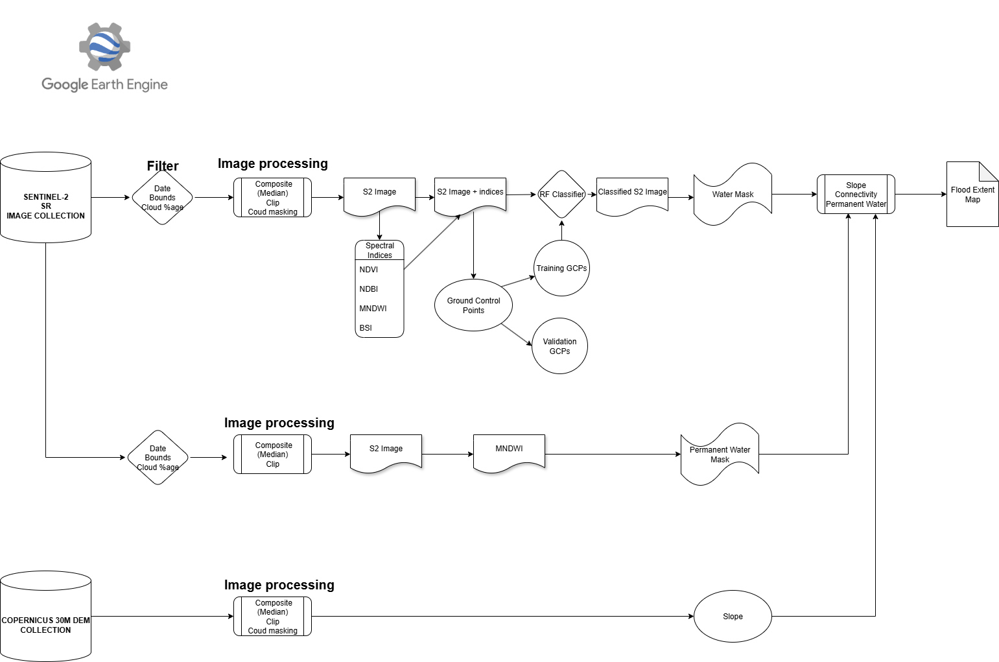



### **Supervised Classification**
Supervised Classification is an application of machine learning in remote sensing where the classification algorithm learns from a training dataset.\
Therefore the classification steps will entail the following:

1.   **Input Image**- This is the Sentinel-2 (S2) image to be classified that has been filtered for the date, region of interest and clouds masked out.
2.   **Collection of Ground Control Points (GCPs)**- These are the user specified points whose land cover is known both on the image and on the ground.\
They are split into **Training** and **Validation** datasets normally taken as 70% and 30% respectively.
3. **Classifier selection & training**- The type of classifier (e.g. Support Vector Machine, Decision Tree, Neural Network etc.) is choosen and trained using the training dataset.
4. **Classify the Image**- The image is classified using the trained classifier
5. **Accuracy Assessment**- The accuracy of the classification exercise is determined using the validation dataset to draw a confusion matrix.

## **Input Image**

The input image is derived from the Sentinel-2 image collection

### **Cloud Masking**
We need to mask out clouds from our input image before proceeding with the analysis.

In [66]:
# Cloud masking function using the QA60 band
def mask_s2_clouds(image):

  qa = image.select('QA60')

  # Bits 10 and 11 are clouds and cirrus, respectively.
  cloud_bit_mask = 1 << 10
  cirrus_bit_mask = 1 << 11

  # Both flags should be set to zero, indicating clear conditions.
  mask = (
      qa.bitwiseAnd(cloud_bit_mask)
      .eq(0)
      .And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
  )

  return image.updateMask(mask).divide(10000)

### **Image Composite**
We visualize the median Sentinel-2 image composite clipped to our area of interest.

In [67]:
#s2_crisis_image = s2_crisis_image.map(mask_s2_clouds)
dataset = (
    tana_s2
    .filterDate('2024-04-29', '2024-04-30')
    .map(mask_s2_clouds)
)
s2_image = ee.Image (dataset.median().clip(aoi))

# Define the visualization parameters for the RGB image.
visualization = {
    'min': 0.0,
    'max': 0.3,
    'bands': ['B4', 'B3', 'B2'],
}

op = geemap.Map()
op.centerObject(aoi, 10)
op.add_layer(s2_image, visualization, 'S2 Crisis RGB')
op

Map(center=[-2.2384554812236734, 40.133002105406774], controls=(WidgetControl(options=['position', 'transparen…

### **Band Selection**
First we get a list of all the available image bands and select the ones that shall be used in the classification.

In [68]:
props = geemap.image_props(s2_image)
props.getInfo()

{'NOMINAL_SCALE': 111319.49079327357,
 'system:band_names': ['B1',
  'B2',
  'B3',
  'B4',
  'B5',
  'B6',
  'B7',
  'B8',
  'B8A',
  'B9',
  'B11',
  'B12',
  'AOT',
  'WVP',
  'SCL',
  'TCI_R',
  'TCI_G',
  'TCI_B',
  'MSK_CLDPRB',
  'MSK_SNWPRB',
  'QA10',
  'QA20',
  'QA60',
  'MSK_CLASSI_OPAQUE',
  'MSK_CLASSI_CIRRUS',
  'MSK_CLASSI_SNOW_ICE']}

We select Bands 1 to 12

In [69]:
# select bands 1 to 12
new_s2_image = s2_image.select(['B1','B2','B3','B4','B5','B6','B7','B8','B9','B11', 'B12'])
props = geemap.image_props(new_s2_image)
props.getInfo()

{'NOMINAL_SCALE': 111319.49079327357,
 'system:band_names': ['B1',
  'B2',
  'B3',
  'B4',
  'B5',
  'B6',
  'B7',
  'B8',
  'B9',
  'B11',
  'B12']}

### **Image Value Addition using Spectral Indices**
Different land cover types have different reflectances across the electromagnetic spectrum as shown in the following spectral curve.
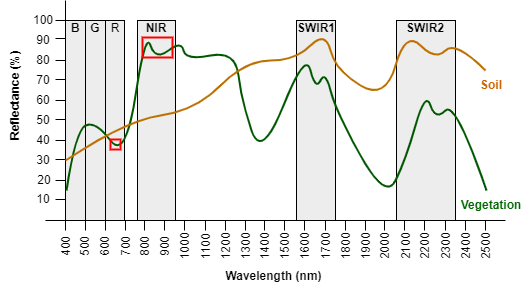

Source: https://uk.mathworks.com/help/images/spectral-indices.html

These differences can be leveraged through spectral band ratioing to define spectral indices that highlight specific surface types.\
For instance in this case we use the Normalize Difference Vegetation Index (NDVI) and the Modified Normalized Difference Water Index (MNDWI).

### **Normalized Difference Vegetation Index (NDVI)**
This index is used to identify vegetation health and ranges from -1 to 1 where values close to 1 indicate healthy vegetation, 0 indicates unhealthy vegetation, and -1 indicates no vegetation.

$$
NDVI = \frac{NIR - Red}{NIR + Red}
$$

For Sentinel-2 this translates to:
$$
NDVI = \frac{B8 - B4}{B8 + B4}
$$

In [70]:
def ndvi(image):
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    return image.addBands(ndvi)

ndviVis = {
  'min': 0,
  'max': 1,
  'palette': [ 'White', 'Green']
}

### Modified normalized difference water index (MNDWI)
This index identifies open water surfaces, reducing background noise from soil, vegetation, and built-up areas. The index value varies in the range (-1, 1).

$$
MNDWI = \frac{Green - SWIR1}{Green + SWIR1}
$$

For Sentinel-2 this translates to:
$$
MNDWI = \frac{B3 - B11}{B3 + B11}
$$

In [71]:
def mndwi(image):
    mndwi = image.normalizedDifference(['B3', 'B11']).rename('MNDWI')
    return image.addBands(mndwi)
mndwiVis = {
  'min': 0,
  'max': 1,
  'palette': ['White','Blue']
}

We apply the NDVI and MNDWI functions to the Sentinel-2 image and visualize the results

In [72]:
new_s2_image = mndwi(new_s2_image)
new_s2_image = ndvi(new_s2_image)
op.addLayer(new_s2_image.select('NDVI'), ndviVis, 'NDVI')
op.addLayer(new_s2_image.select('MNDWI'), mndwiVis, 'MNDWI')
op

Map(bottom=133002.0, center=[-2.2384554812236734, 40.133002105406774], controls=(WidgetControl(options=['posit…

In [73]:
props = geemap.image_props(new_s2_image)
props.getInfo()

{'NOMINAL_SCALE': 111319.49079327357,
 'system:band_names': ['B1',
  'B2',
  'B3',
  'B4',
  'B5',
  'B6',
  'B7',
  'B8',
  'B9',
  'B11',
  'B12',
  'MNDWI',
  'NDVI']}

### Input Data Normalization
Due to the addition os the spectral indices bands, the input band values vary across a wide range. If classification is done in this wide range, the classifier will have a bias towards the larger values. Normalization of the input dataset restricts all values to a range from 0 to 1.

In [74]:
def normalize(image):
    bandNames = image.bandNames()
   # Compute min and max of the image
    minDict = image.reduceRegion(**{
    "reducer" : ee.Reducer.min(),
    "geometry" : aoi,
    "scale" : 10,
    "maxPixels" : 1e9,
    "bestEffort": True,
    "tileScale" : 16
    })
    maxDict = image.reduceRegion(**{
    "reducer" : ee.Reducer.max(),
    "geometry" : aoi,
    "scale" : 10,
    "maxPixels" : 1e9,
    "bestEffort": True,
    "tileScale" : 16
    })
    mins = ee.Image.constant(minDict.values(bandNames))
    maxs = ee.Image.constant(maxDict.values(bandNames))

    normalized = image.subtract(mins).divide(maxs.subtract(mins))
    return normalized

new_s2_image = normalize(new_s2_image)

### **Collect Ground Control Points**
Ground Control Points (GCPs) refer to data whose values on the ground and on the image are known. Ideally, ground control points are collected on site (in situ data collection). However, for this case study the GCPs were digitized on the input image as feature collections on the GEE API and copied to colab./
The computer/machine/algorithm/classifier uses these values to understand or learn the region of interest and predict clusters of pixel values for the entire image.
For our project, the aim was to classify the image into four (4) classes namely:


*   Urban (0)
*   Bare (1)
*   Water (2)
*   Vegetation (3)

One hundred (100) GCPs were collected for each land cover class in order to get an adequate sample for training the classifier and validation.

In [75]:
# Load uploaded training data
training_fc = ee.FeatureCollection("users/Kimana_ChangeDetection/tanaR_gcps")

### **Divide the GCPs into Training and Validation Datasets**
The GCPs are split into two groups, 80% being training data to be used in the machine learning process (supervised classification) and 20% used in validation to determine the accuracy of the classification exercise.
To minimize the bias in performing this split, a random column is added

In [76]:
# Add a random value to each point
training_fc = training_fc.randomColumn(columnName='random')

# 80% for training
train_fc = training_fc.filter(ee.Filter.lt('random', 0.8))

# 20% for validation
valid_fc = training_fc.filter(ee.Filter.gte('random', 0.8))
op.add_layer(train_fc, {'color': 'black'}, 'Training sample', False)
op.add_layer( valid_fc, {'color': 'red'}, 'Validation sample', False)
op

Map(bottom=133002.0, center=[-2.2384554812236734, 40.133002105406774], controls=(WidgetControl(options=['posit…

### **Train the Classifier**

In [77]:
# Sample the image using the labeled features
training = new_s2_image.sampleRegions(
    collection=train_fc,
    properties=['landcover'],  # or your class label name
    scale=10
)

In [78]:
valid_samples = new_s2_image.sampleRegions(
    collection=valid_fc,
    properties=['landcover'],
    scale=10
)

In [79]:
# Train a Random Forest classifier
classifier = ee.Classifier.smileRandomForest(50).train(
    features=training,
    classProperty='landcover',
    #inputProperties=['B2', 'B3', 'B4', 'B8']
)

### **Classify the Image**

In [80]:
# Classify the image
classified = new_s2_image.classify(classifier)


visualize the result

In [83]:
# define the visualization parameters
s2_class_vis= {'min': 0, 'max': 3, 'palette': ["#ff0000","#ffca3a","#1982c4","#8ac926"]}
# add the layer to display
op.add_layer(classified,s2_class_vis, 'Classified Sentinel-2 Image')
legend_dict = {
    '0 Urban': "#ff0000",
    '1 Bare Soil': "#ffca3a",
    '2 Water': "#1982c4",
    '3 Vegetation': "#8ac926"
}
op.add_legend(title = 'Landcover Class', legend_dict = legend_dict)
op

Map(bottom=531789.0, center=[-2.4715003411857865, 40.40067672729493], controls=(WidgetControl(options=['positi…

Calculate the respective land cover class areas

In [ ]:
s2_class_area = geemap.image_area_by_group(
    classified, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
s2_class_area

Calculating area for group 0 ...
Calculating area for group 1 ...
Calculating area for group 2 ...
Calculating area for group 3 ...


,area,percentage
group,,
0,1088.4637,0.2804
1,398.7172,0.1027
2,219.4536,0.0565
3,2175.2916,0.5604


### **Post-Processing**
We apply the permanent water, slope and neighbourhood conditions to get the flood mask.

In [82]:
s2_water_mask = classified.eq(2)
s2_water_mask = s2_water_mask.updateMask(s2_water_mask)
s2_flood_map = s2_water_mask.where(permanent_water,0)
s2_flood_map = connectivity(s2_flood_map).selfMask()
s2_flood_map = slope_condition(s2_flood_map).selfMask()
op.add_layer(s2_flood_map, {'palette':['royalblue']}, 'S2 Refined Flood Map', False)
op

Map(bottom=133002.0, center=[-2.2384554812236734, 40.133002105406774], controls=(WidgetControl(options=['posit…

In [ ]:
s2_flood_map.bandNames()

### **Sentinel-2 Flood Area**

In [ ]:
s2_flood_map = geemap.image_area_by_group(
    s2_flood_map, region= aoi, scale=10, denominator=1e6, decimal_places=4, verbose=True
)
s2_flood_map

Calculating area for group 1 ...


,area,percentage
group,,
1,194.2941,1.0


In [ ]:
#calculate the flood area detected by Sentinel-2
s2_flooded_area = s2_flood_map.multiply(ee.Image.pixelArea())
s2_flooded_stats = s2_flooded_area.reduceRegion(
    reducer = ee.Reducer.sum(),
    geometry = aoi,
    scale = 30,
    #bestEffort = True,
    maxPixels = 1e15,
    tileScale = 16
    )
final_area_s2 = s2_flooded_stats.getNumber('classification').divide(1e6)
final_area_s2

## **Comparative Results**
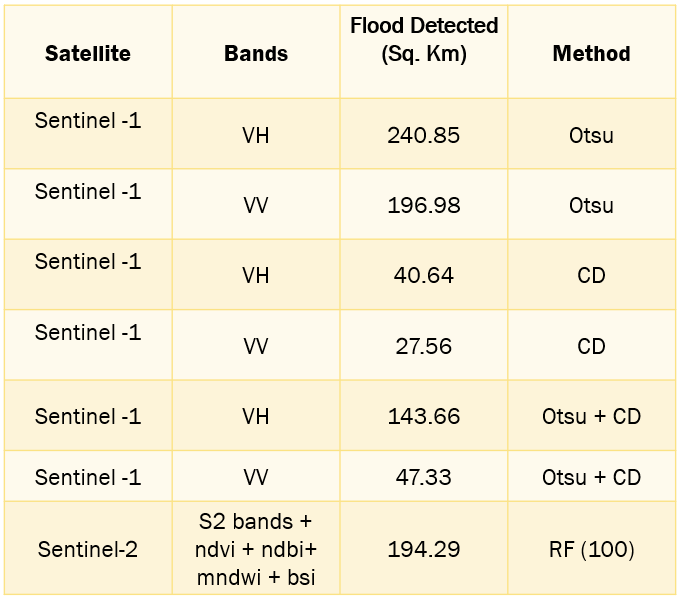

## **Discussion**

•	The single image S1 and S2 approaches are good for surface water detection. However, their accuracy for flood extent mapping rely on accuracy of post processing datasets.

•	The accuracy of the multi-temporal change detection depends on the change threshold chosen.

•	The Otsu Threshold works best for images with bimodal histograms (2 distinct classes).

•	The VH channel is sensitive to vegetation and is good for detection of inundated vegetation. However, for change detection approaches the VH may overestimate floods by capturing vegetation changes caused by other factors.

•	These approaches are not suitable for automation of flood extent mapping.


## **Conclusion**
●	SAR offers a great solution for water detection, which is the key pre-requisite for flood extent mapping. Whereas many flood detection approaches have been proposed over the years, further research and innovation is required to improve its accuracy in complex land cover areas as well as for automation of rapid flood extent mapping.

●	The availability of Sentinel-1 imagery on Google Earth Engine (GEE) will enable leveraging of SAR’s all weather/day & night capabilities with GEE’s powerful cloud computing resources for global scale geospatial disaster risk reduction applications.


## **Data Export**
For further desktop analysis and visualization on QGIS, we need to export our outputs.

In [ ]:
# Export function

def export_image(image, description):
  geemap.ee_export_image_to_drive(
    image, description= description, folder='earthEngine', region=aoi.geometry(), scale=10
  )



1. Otsu VH Flood Map

In [ ]:
# export the sentinel-1 Otsu vh flood extent map
export_image(otsu_flood_mask_vh, description='otsu_flood_mask_vh')

 2. Otsu VV Flood Map

In [ ]:
# export the sentinel-1 vv Otsu flood extent map
export_image(otsu_flood_mask_vv, description='otsu_flood_mask_vv')

3. CD VH Flood Map

In [ ]:
# export the sentinel-1 vh cd flood extent map
export_image(cd_flood_mask_vh, description='cd_flood_mask_vh')

4. CD VV Flood Map

In [ ]:
# export the sentinel-1 vv cd flood extent map
export_image(cd_flood_mask_vv, description='cd_flood_mask_vv')

5. Hybrid VH Flood Map

In [ ]:
# export the sentinel-1 vh hybrid flood extent map
export_image(hbd_flood_map_vh, description='hbd_flood_map_vh')

6. Hybrid VV Flood Map

In [ ]:
# export the sentinel-1 vv hybrid flood extent map
export_image(hbd_flood_map_vv, description='hbd_flood_map_vv')

7. Sentinel-2 Flood Map

In [ ]:
# export the sentinel-2 flood extent map
export_image(s2_flood_map, description='s2_flood_map')

#                                  **THE END**